In [1]:
import numpy as np
import pandas as pd

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F

import math
import random
from copy import deepcopy
import json
import time
from tqdm import tqdm


# Dataset
from utils.dataset import CrowdAI
# Network
from models.backbone import DetectionBranch, R2U_Net, NonMaxSuppression
from models.matching import ScoreNet, AttentionalGNN
# Utils
from utils.utils import (graph_to_vertex_mask, polygon_to_vertex_mask, tensor_to_numpy, point_to_polygon, polygon_to_seg_mask,
                        scores_to_permutations, permutations_to_polygons)
from utils.utils import sort_sync_nsm_points, prepare_gt_vertices, angle_between_points, soft_winding_number
from utils.loss import cross_entropy_loss, iou_loss_function, compute_l_angle_loss

import matplotlib.pyplot as plt

from shapely.geometry import Polygon
from rasterio import features

from skimage import io
from skimage.transform import resize
import cv2
from PIL import Image


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [2]:
WINDOW_SIZE = 256
MAX_POINTS = 256

# Data

In [3]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [4]:
# Initiate the dataloader
batch_size = 4
dataset = CrowdAI(images_directory='data/val/images/', annotations_path='data/val/annotation.json', window_size=WINDOW_SIZE)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2, collate_fn=collate_fn)

In [5]:
image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix, gt_polygons, gt_graph, gt_vertices, gt_dic = next(iter(dataloader))

In [6]:
image = torch.stack(image)
gt_vertex_mask = torch.stack(gt_vertex_mask)
gt_seg_mask = torch.stack(gt_seg_mask)
gt_permutation_matrix = torch.stack(gt_permutation_matrix)
gt_graph = torch.stack(gt_graph)
# gt_vertices = torch.stack(gt_vertices)

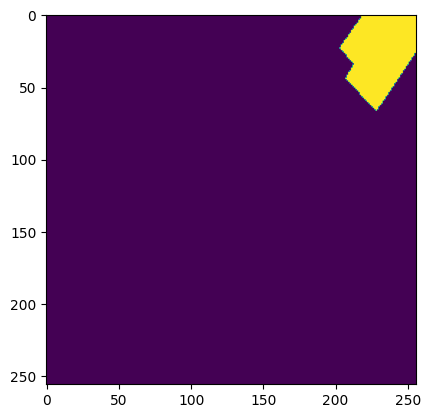

In [7]:
p = permutations_to_polygons(gt_permutation_matrix, gt_graph)
m = np.zeros((WINDOW_SIZE, WINDOW_SIZE), dtype=np.uint8)

cv2.fillPoly(m, [p[0][1].detach().cpu().numpy().astype(int)], 1)
plt.imshow(m)

In [8]:
print('Image: ', image.shape)
print('Vertex: ', gt_vertex_mask.shape)
print('Segmentation: ', gt_seg_mask.shape)
print('Permutation: ', gt_permutation_matrix.shape)

Image:  torch.Size([4, 256, 256, 3])
Vertex:  torch.Size([4, 256, 256])
Segmentation:  torch.Size([4, 256, 256])
Permutation:  torch.Size([4, 256, 256])


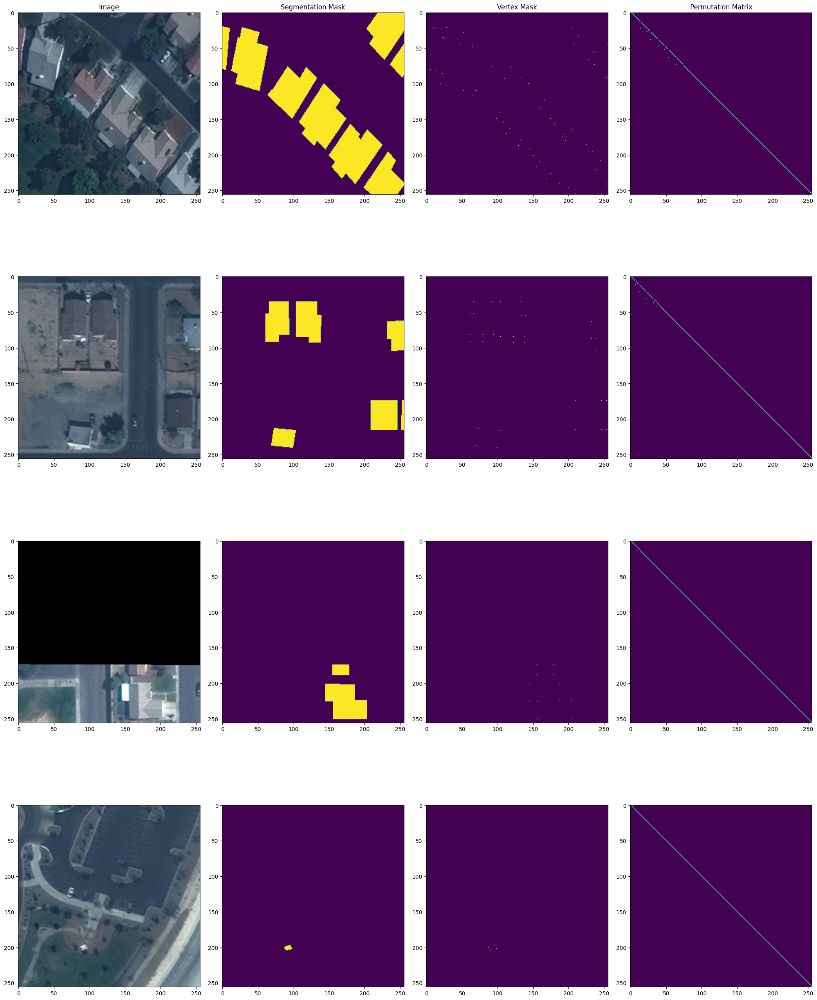

In [9]:
# plot all the masks and the images in the batch
B = len(image)
fig, axes = plt.subplots(B, 4, figsize=(21, 7*B))
for i in range(B):
    axes[i, 0].imshow(image[i])
    axes[i, 1].imshow(gt_seg_mask[i])
    axes[i, 2].imshow(gt_vertex_mask[i])
    axes[i, 3].imshow(gt_permutation_matrix[i])

    # axes[i, 0].axis('off')
    # axes[i, 1].axis('off')
    # axes[i, 2].axis('off')
    # axes[i, 3].axis('off')


    axes[0, 0].set_title('Image')
    axes[0, 1].set_title('Segmentation Mask')
    axes[0, 2].set_title('Vertex Mask')
    axes[0, 3].set_title('Permutation Matrix')

    
plt.tight_layout()
plt.show()

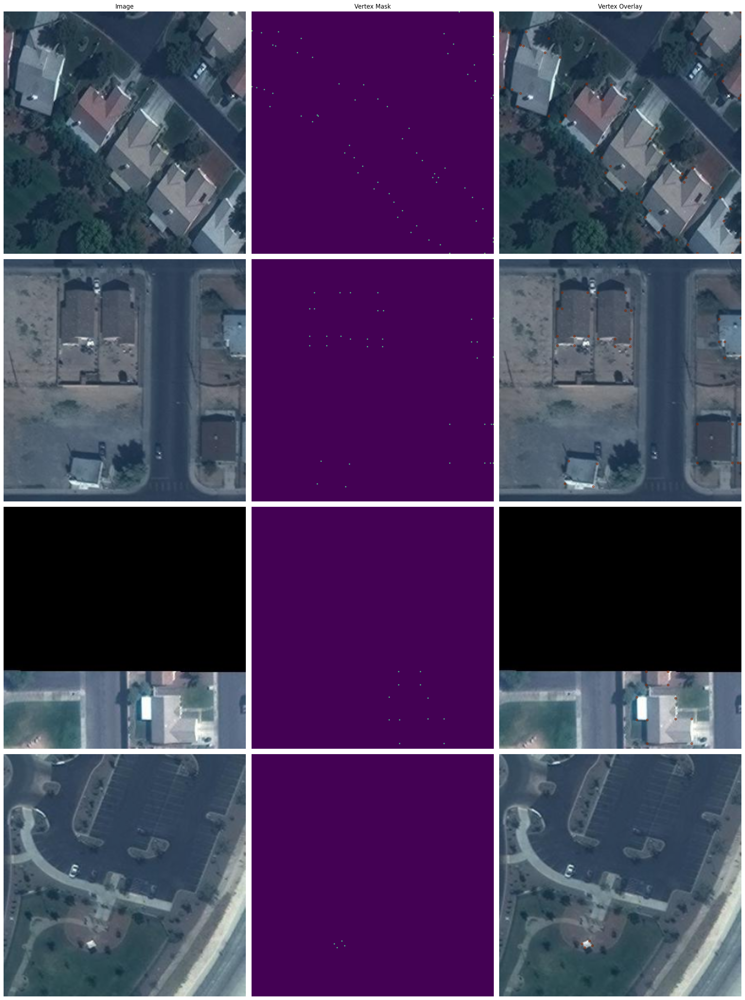

In [10]:
# plot all the images, vertex masks, and scatter plots in the batch
B = len(image)


fig, axes = plt.subplots(B, 3, figsize=(21, 7*B))

for i in range(B):
    # Original image
    axes[i, 0].imshow(image[i])
    axes[0, 0].set_title('Image')
    axes[i, 0].axis('off')

    # Vertex mask as image
    axes[i, 1].imshow(gt_vertex_mask[i], cmap='viridis')
    axes[0, 1].set_title('Vertex Mask')
    axes[i, 1].axis('off')

    # Scatter plot of vertex mask on original image
    axes[i, 2].imshow(image[i])
    y, x = np.nonzero(gt_vertex_mask[i].numpy())
    scatter = axes[i, 2].scatter(x, y, c=gt_vertex_mask[i].numpy()[y, x], s=20, alpha=0.5, cmap='Oranges_r')
    axes[0, 2].set_title(f'Vertex Overlay')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

# Matching Network

In [11]:
class OptimalMatching(nn.Module):

    def __init__(self):
        super(OptimalMatching, self).__init__()
        
        # Default configuration settings
        self.descriptor_dim = 64
        self.sinkhorn_iterations = 100
        self.attention_layers = 4
        self.correction_radius = 0.05

        # Modules
        self.scorenet1 = ScoreNet(self.descriptor_dim * 2)
        self.scorenet2 = ScoreNet(self.descriptor_dim * 2)
        self.gnn = AttentionalGNN(self.descriptor_dim, self.attention_layers)
            

    def normalize_coordinates(self, graph, ws, input):
        if input == 'global':
            graph = (graph * 2 / ws - 1)
        elif input == 'normalized':
            graph = ((graph + 1) * ws / 2)
            graph = torch.round(graph).long()
            graph[graph < 0] = 0
            graph[graph >= ws] = ws - 1
        return graph




    def log_optimal_transport_batch(self, Z, iters):
        """
        Computes the optimal transport between all pairs of rows and columns of a batch of cost matrices Z in log space,
        using the Sinkhorn algorithm.

        Args:
            Z: a tensor of shape (batch_size, m, n) representing a batch of cost matrices, where m is the number of rows
            and n is the number of columns.
            iters: the number of Sinkhorn iterations to perform.

        Returns:
            A tensor of the same shape as Z, containing the optimal transport plan between all pairs of rows and columns
            in the batch.
        """
        batch_size, m, n = Z.shape
        log_mu = -torch.tensor(m).to(Z).log().expand(batch_size, m)
        log_nu = -torch.tensor(n).to(Z).log().expand(batch_size, n)
        u, v = torch.zeros_like(log_mu), torch.zeros_like(log_nu)

        for _ in range(iters):
            v = log_nu - torch.logsumexp(Z + u.unsqueeze(-1), dim=-2)
            u = log_mu - torch.logsumexp(Z + v.unsqueeze(-2), dim=-1)

        return Z + u.unsqueeze(-1) + v.unsqueeze(-2)





    def predict(self, image, descriptors, graph):
        B, _, H, W = image.shape
        B, N, _ = graph.shape
        
        for b in range(B):
            b_desc = descriptors[b]
            b_graph = graph[b]

            # Extract descriptors
            b_desc = b_desc[:, b_graph[:,0], b_graph[:,1]]

            # Concatenate descriptors in batches
            if b == 0:                    
                sel_desc = b_desc.unsqueeze(0)
            else:
                sel_desc = torch.cat((sel_desc, b_desc.unsqueeze(0)), dim=0)


        ''' AGNN '''
        # Multi-layer Transformer network. (Attentional Graph Neural Network)
        norm_graph = self.normalize_coordinates(graph, W, input="global") #out: normalized coordinate system [-1, 1]
        sel_desc, offset = self.gnn(sel_desc, norm_graph)

        # Correct points coordinates
        norm_graph = norm_graph + offset * self.correction_radius
        graph = self.normalize_coordinates(norm_graph, W, input="normalized") # out: global coordinate system [0, W]

        ''' Optimal Matching '''
        # Compute scores (Optimal connection Network)
        scores_1 = self.scorenet1(sel_desc) # Clockwise Scores
        scores_2 = self.scorenet2(sel_desc) # Counter-Clockwise Scores
        scores = scores_1 + torch.transpose(scores_2, 1, 2) # Permutation Matrix

        sinkhorn_scores = self.log_optimal_transport_batch(scores, self.sinkhorn_iterations)
        

        ''' Post-Processing '''
        permutation_mat = scores_to_permutations(sinkhorn_scores) # linear sum assignment
        poly = permutations_to_polygons(permutation_mat, graph, out='torch')
        
        graph = graph.float()
        graph.requires_grad = True


        return poly, permutation_mat, scores, sinkhorn_scores, graph

# Training

### Models

In [12]:
# Backbone
model = R2U_Net()
model = model.to(device)
model = model.train()
model.load_state_dict(torch.load('trained_weights/polyworld_backbone', map_location=device))

# Vertex Detection
head_ver = DetectionBranch()
head_ver = head_ver.to(device)
head_ver = head_ver.train()
head_ver.load_state_dict(torch.load('trained_weights/polyworld_seg_head', map_location=device))

# NMS
suppression = NonMaxSuppression()
suppression = suppression.to(device)

# Matching
matching = OptimalMatching()
matching = matching.to(device)
matching = matching.train()
# matching.load_state_dict(torch.load('trained_weights/polyworld_matching', map_location=device))

# Freeze 
for param in model.parameters():
    param.requires_grad = False

for param in head_ver.parameters():
    param.requires_grad = False

# for param in matching.parameters():
#     param.requires_grad = False

### Training Loop

In [13]:
# Optimizer
optimizer = torch.optim.Adam([
    # {'params': model.parameters()},
    # {'params': head_ver.parameters()},
    {'params': matching.parameters()}
], lr=1e-4)

In [14]:
w = 100
# detection_loss_function = nn.BCELoss(weight=torch.tensor([w])).to(device) # For Vertices # Cuda Error using this loss!
# detection_loss_function = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([w])).to(device) # For Vertices

# matching_loss_function = nn.CrossEntropyLoss().to(device)  # For Permutation Matrix
# matching_loss_function = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([w])).to(device)
# matching_loss_function = nn.NLLLoss().to(device)
# matching_loss_function = nn.BCELoss(weight=torch.tensor([w])).to(device)

In [15]:
dataloader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=4, collate_fn=collate_fn)

  0%|          | 0/60317 [00:00<?, ?it/s]

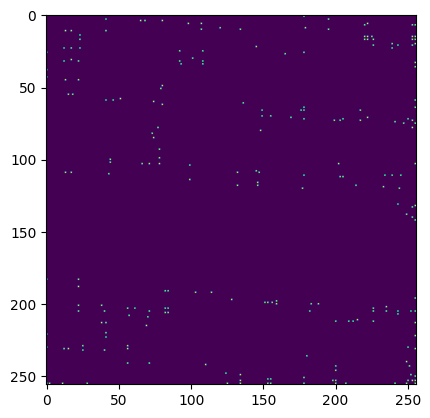

/home/amir/miniconda3/envs/poly/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
  0%|          | 1/60317 [00:02<48:02:28,  2.87s/it]

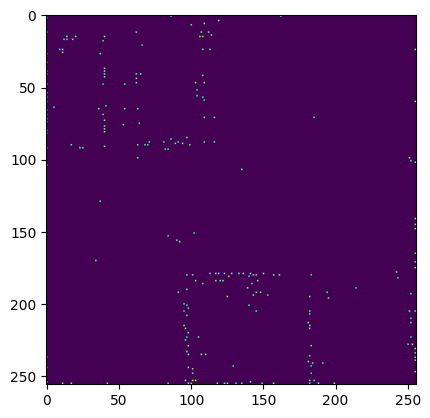

  0%|          | 2/60317 [00:03<23:46:53,  1.42s/it]

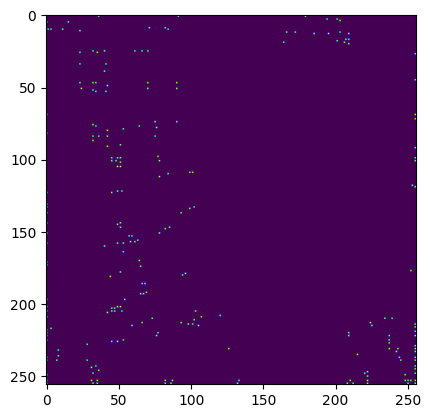

  0%|          | 3/60317 [00:03<16:38:28,  1.01it/s]

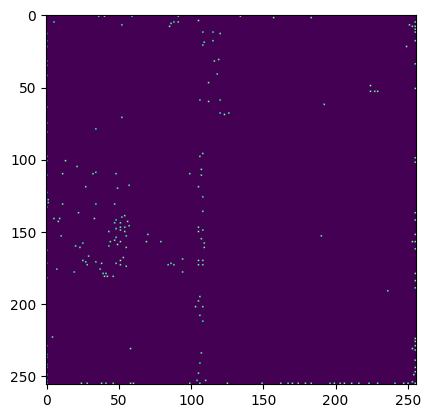

  0%|          | 4/60317 [00:04<12:47:26,  1.31it/s]

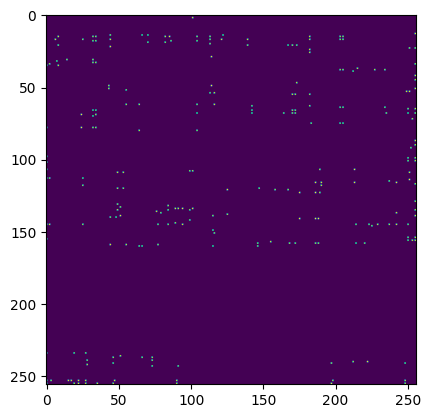

  0%|          | 5/60317 [00:04<10:42:51,  1.56it/s]

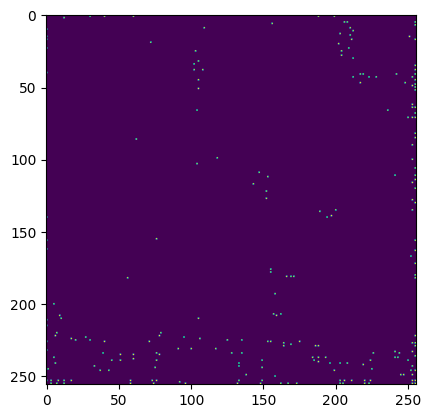

  0%|          | 6/60317 [00:05<9:24:50,  1.78it/s] 

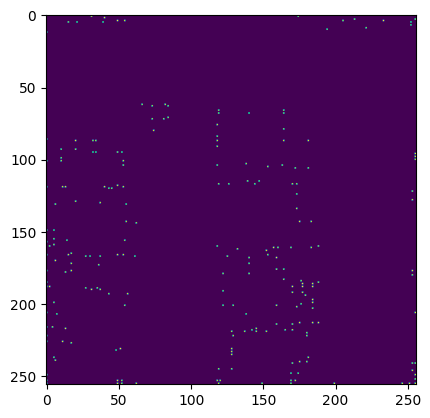

  0%|          | 7/60317 [00:05<8:40:25,  1.93it/s]

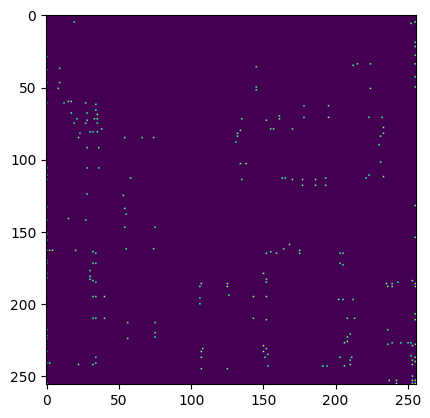

  0%|          | 8/60317 [00:05<8:07:00,  2.06it/s]

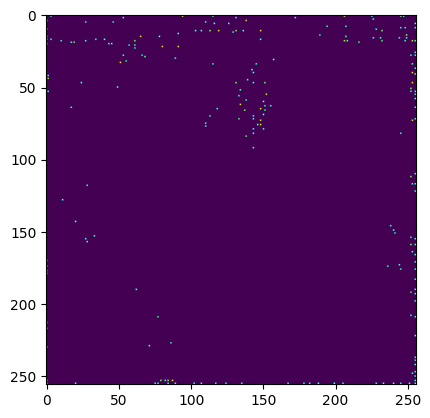

  0%|          | 9/60317 [00:06<7:39:30,  2.19it/s]

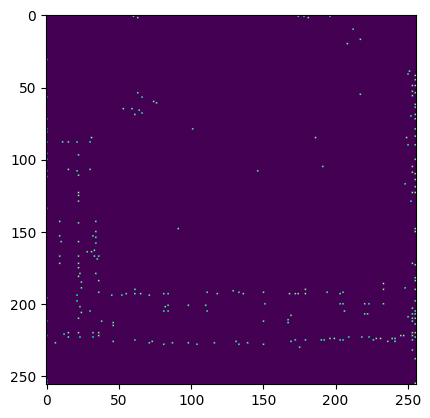

  0%|          | 10/60317 [00:06<7:17:43,  2.30it/s]

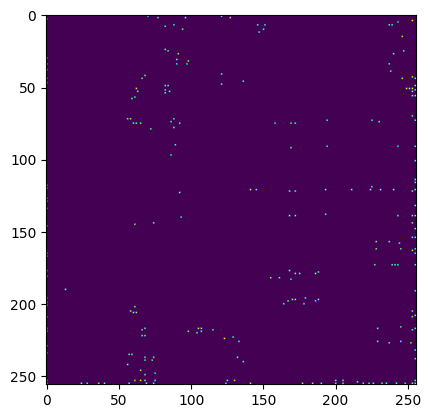

  0%|          | 10/60317 [00:06<11:33:35,  1.45it/s]


KeyboardInterrupt: 

In [16]:
EPOCHS = 300
LAMBDA = 1000

for epoch in range(EPOCHS):
    for image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix, gt_polygons, gt_graph, gt_vertices, gt_dic in tqdm(dataloader):

        # DATA PREPARATION
        image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix = torch.stack(image), torch.stack(gt_vertex_mask), torch.stack(gt_seg_mask), torch.stack(gt_permutation_matrix)
        # Move Inputs to Device
        image = image.float().permute(0, 3, 1, 2).to(device)
        gt_seg_mask = gt_seg_mask.permute(0, 2, 1).to(device)
        gt_permutation_matrix = gt_permutation_matrix.to(device)
        # gt_polygons = gt_polygons.to(device)
        # gt_vertex_mask = gt_vertex_mask.to(device)

        
        optimizer.zero_grad()
        # FORWARD
        # Backbone
        features = model(image)
        # 1x1 Conv
        vertex_logits = head_ver(features) # occupancy grid
        # NMS
        _ , graph = suppression(vertex_logits) # (B, 256, 2) --> Vertex Positions
        # Sorting
        graph = sort_sync_nsm_points(graph, gt_vertices, gt_dic).to(device) # Necessary or not? YES


        plt.imshow(graph_to_vertex_mask(graph, image)[0].detach().cpu().numpy())
        plt.show()

        # Matching
        # polys, permutation_matrix, scores, sinkhorn_scores, graph
        polys, permutation_matrix, _, sinkhorn_scores, graph = matching.predict(image, features, graph) # Graph --> Vertex Points | features --> descriptors
        del image, features

        # Create Seg Mask
        # pred_mask = polygon_to_seg_mask(polys, WINDOW_SIZE)
        try:
            pred_mask = soft_winding_number(polys, lam=LAMBDA, img_size=WINDOW_SIZE, device=device)
        except Exception as e:
            print(e)
            print('skipping the th iteration')
            continue
        # soft_winding() --> Diffrentiable Segmentation Mask --> IoU Loss
        # pred_mask = soft_winding_number(polys, lam=LAMBDA, img_size=WINDOW_SIZE)


        # LOSS
        # detection_loss = detection_loss_function(vertex_logits.squeeze(1), gt_vertex_mask.float())
        # del vertex_logits, gt_vertex_mask
        segmentation_loss = iou_loss_function(pred_mask, gt_seg_mask)
        # del gt_seg_mask
        # matching_loss = matching_loss_function(sinkhorn_scores, gt_permutation_matrix.float())
        matching_loss = cross_entropy_loss(sinkhorn_scores, gt_permutation_matrix)
        pred_angle, gt_angle = compute_l_angle_loss(gt_permutation_matrix.double(), gt_vertices, permutation_matrix, graph, device=device)
        # del gt_permutation_matrix
        angle_loss = torch.mean(1 - torch.exp(-10 * torch.abs((pred_angle - gt_angle))))
        loss = matching_loss + segmentation_loss * 10 + angle_loss



        # BACKWARD
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()


    



    # print('Detection Loss: ', detection_loss)
    print('Segmentation Loss: ', segmentation_loss)
    print('Matching Loss: ', matching_loss)
    print('Angle Loss: ', angle_loss)
    print(f"Epoch {epoch} - Loss: {loss.item()}")




    # plt.imshow(vertex_logits[0].detach().cpu().numpy().squeeze())
    # plt.show()
    # plt.imshow(permutation_matrix[0].detach().cpu().numpy())
    # plt.show()
    # plt.imshow(gt_permutation_matrix[0].detach().cpu().numpy())
    # plt.show()
    # plt.imshow(gt_seg_mask[0].detach().cpu().numpy())
    # plt.show()
    # plt.imshow(pred_mask[0].detach().cpu().numpy())
    # plt.show()
    # plt.imshow(scores[0].detach().cpu().numpy())    
    # plt.show()
    # plt.imshow(vertex_logits[0].detach.cpu().numpy())
    # plt.show()

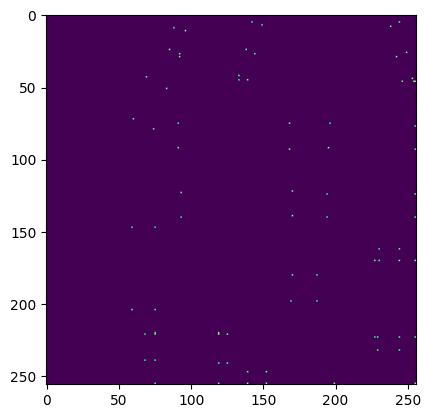

In [17]:
plt.imshow(gt_vertex_mask[0].detach().cpu().numpy())

### Save

In [ ]:
# save the complete model and optimizer state
torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            }, 'trained_weights/polyworld_backbone_overfit_1sample.pth')

### Inference

In [18]:
# Inputs
image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix, gt_polygons, gt_graph, gt_vertices, gt_dic = next(iter(dataloader))
image, gt_vertex_mask, gt_seg_mask, gt_permutation_matrix = torch.stack(image), torch.stack(gt_vertex_mask), torch.stack(gt_seg_mask), torch.stack(gt_permutation_matrix)
image = image.float().cuda().permute(0, 3, 1, 2)

In [19]:
print('Image: ', image.shape)
print('Vertex: ', gt_vertex_mask.shape)
print('Segmentation: ', gt_seg_mask.shape)
print('Permutation: ', gt_permutation_matrix.shape)

Image:  torch.Size([1, 3, 256, 256])
Vertex:  torch.Size([1, 256, 256])
Segmentation:  torch.Size([1, 256, 256])
Permutation:  torch.Size([1, 256, 256])


In [20]:
# Outputs
features = model(image)
vertex_logits = head_ver(features)
_ , graph = suppression(vertex_logits)
poly, permutation_matrix, scores, sinkhorn_scores, graph = matching.predict(image, features, graph) 

In [21]:
gt_graph[0]

tensor([[221.,  21.],
        [222.,  15.],
        [222.,  10.],
        [223.,   0.],
        [255.,   0.],
        [255.,  23.],
        [221.,  21.],
        [245., 110.],
        [234., 109.],
        [233., 117.],
        [216., 116.],
        [217., 108.],
        [219.,  96.],
        [221.,  75.],
        [255.,  79.],
        [255., 130.],
        [243., 129.],
        [245., 110.],
        [150.,  23.],
        [152.,   0.],
        [207.,   0.],
        [206.,   5.],
        [194.,   4.],
        [193.,  10.],
        [180.,   9.],
        [179.,  24.],
        [150.,  23.],
        [ 94.,  31.],
        [ 95.,  23.],
        [107.,  23.],
        [107.,  32.],
        [ 94.,  31.],
        [ 11.,  22.],
        [ 11.,  13.],
        [ 22.,  13.],
        [ 22.,  22.],
        [ 11.,  22.],
        [ 83.,  60.],
        [ 84.,  52.],
        [ 99.,  52.],
        [ 98.,  61.],
        [136.,  62.],
        [133., 116.],
        [100., 116.],
        [101., 104.],
        [ 

In [22]:
sort_sync_nsm_points(torch.stack(gt_graph), gt_vertices, gt_dic)

tensor([[[221,  21],
         [222,  15],
         [222,  10],
         [223,   0],
         [255,   0],
         [255,  23],
         [245, 110],
         [234, 109],
         [233, 117],
         [216, 116],
         [217, 108],
         [219,  96],
         [221,  75],
         [255,  79],
         [255, 130],
         [243, 129],
         [150,  23],
         [152,   0],
         [207,   0],
         [206,   5],
         [194,   4],
         [193,  10],
         [180,   9],
         [179,  24],
         [ 94,  31],
         [ 95,  23],
         [107,  23],
         [107,  32],
         [ 11,  22],
         [ 11,  13],
         [ 22,  13],
         [ 22,  22],
         [ 83,  60],
         [ 84,  52],
         [ 99,  52],
         [ 98,  61],
         [136,  62],
         [133, 116],
         [100, 116],
         [101, 104],
         [ 81, 104],
         [  0, 185],
         [ 23, 186],
         [ 22, 203],
         [ 45, 205],
         [ 43, 221],
         [ 42, 230],
         [ 41

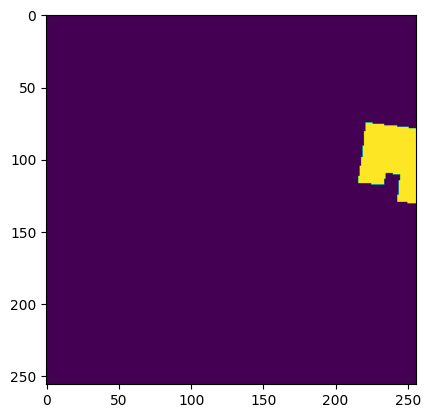

In [23]:
p = permutations_to_polygons(gt_permutation_matrix, gt_graph)
m = np.zeros((WINDOW_SIZE, WINDOW_SIZE), dtype=np.uint8)

cv2.fillPoly(m, [p[0][1].detach().cpu().numpy().astype(int)], 1)
plt.imshow(m)

In [24]:
# find the index of the first (0,0) element in the gt_graph
idx = 0
for i in range(len(gt_graph[0])):
    if gt_graph[0][i][0] == 0 and gt_graph[0][i][1] == 0:
        idx = i
        break

In [25]:
gt_dic[0]

{(221.0, 21.0): 0,
 (222.0, 15.0): 1,
 (222.0, 10.0): 2,
 (223.0, 0.0): 3,
 (255.0, 0.0): 4,
 (255.0, 23.0): 5,
 (245.0, 110.0): 6,
 (234.0, 109.0): 7,
 (233.0, 117.0): 8,
 (216.0, 116.0): 9,
 (217.0, 108.0): 10,
 (219.0, 96.0): 11,
 (221.0, 75.0): 12,
 (255.0, 79.0): 13,
 (255.0, 130.0): 14,
 (243.0, 129.0): 15,
 (150.0, 23.0): 16,
 (152.0, 0.0): 17,
 (207.0, 0.0): 18,
 (206.0, 5.0): 19,
 (194.0, 4.0): 20,
 (193.0, 10.0): 21,
 (180.0, 9.0): 22,
 (179.0, 24.0): 23,
 (94.0, 31.0): 24,
 (95.0, 23.0): 25,
 (107.0, 23.0): 26,
 (107.0, 32.0): 27,
 (11.0, 22.0): 28,
 (11.0, 13.0): 29,
 (22.0, 13.0): 30,
 (22.0, 22.0): 31,
 (83.0, 60.0): 32,
 (84.0, 52.0): 33,
 (99.0, 52.0): 34,
 (98.0, 61.0): 35,
 (136.0, 62.0): 36,
 (133.0, 116.0): 37,
 (100.0, 116.0): 38,
 (101.0, 104.0): 39,
 (81.0, 104.0): 40,
 (0.0, 185.0): 41,
 (23.0, 186.0): 42,
 (22.0, 203.0): 43,
 (45.0, 205.0): 44,
 (43.0, 221.0): 45,
 (42.0, 230.0): 46,
 (41.0, 234.0): 47,
 (26.0, 233.0): 48,
 (27.0, 229.0): 49,
 (0.0, 227.0): 50,

In [26]:
gt_graph[0][idx]

tensor([0., 0.])

In [27]:
idx

124

In [28]:
sorted(gt_graph)

[tensor([[221.,  21.],
         [222.,  15.],
         [222.,  10.],
         [223.,   0.],
         [255.,   0.],
         [255.,  23.],
         [221.,  21.],
         [245., 110.],
         [234., 109.],
         [233., 117.],
         [216., 116.],
         [217., 108.],
         [219.,  96.],
         [221.,  75.],
         [255.,  79.],
         [255., 130.],
         [243., 129.],
         [245., 110.],
         [150.,  23.],
         [152.,   0.],
         [207.,   0.],
         [206.,   5.],
         [194.,   4.],
         [193.,  10.],
         [180.,   9.],
         [179.,  24.],
         [150.,  23.],
         [ 94.,  31.],
         [ 95.,  23.],
         [107.,  23.],
         [107.,  32.],
         [ 94.,  31.],
         [ 11.,  22.],
         [ 11.,  13.],
         [ 22.,  13.],
         [ 22.,  22.],
         [ 11.,  22.],
         [ 83.,  60.],
         [ 84.,  52.],
         [ 99.,  52.],
         [ 98.,  61.],
         [136.,  62.],
         [133., 116.],
         [1

In [29]:
gt_graph[0].sort(dim=0, descending=True)

torch.return_types.sort(
values=tensor([[255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 254.],
        [253., 253.],
        [245., 253.],
        [245., 253.],
        [243., 250.],
        [234., 249.],
        [233., 249.],
        [226., 243.],
        [226., 242.],
        [223., 242.],
        [222., 238.],
        [222., 238.],
        [221., 234.],
        [221., 233.],
        [221., 230.],
        [219., 229.],
        [217., 227.],
        [216., 226.],
        [207., 221.],
        [206., 215.],
        [206., 213.],
        [205., 208.],
        [203., 207.],
        [202., 206.],
        [202., 205.],
        [194., 203.],
        [193., 203.],
        [185., 203.],
        [180., 202.],
        [179., 199.],
        [178., 199.],
        [177., 197.],
        [177., 197.],
        [161., 196.],
        [155., 193.],
        [155., 186.],
        [152., 185.],
        [150., 185.],
        [150., 130.],


In [30]:
graph[0]

tensor([[  4., 252.],
        [  3., 143.],
        [ 75., 201.],
        [  1.,  10.],
        [255., 152.],
        [255., 200.],
        [254., 246.],
        [133., 251.],
        [  2., 132.],
        [104.,  40.],
        [114., 200.],
        [  3.,  76.],
        [186.,   0.],
        [  3.,  63.],
        [  0., 193.],
        [109.,  12.],
        [ 10., 252.],
        [  5., 217.],
        [255., 175.],
        [104.,  67.],
        [ 17., 217.],
        [104.,  75.],
        [242., 109.],
        [ 61., 133.],
        [ 60.,  18.],
        [192.,  82.],
        [120., 142.],
        [120., 213.],
        [ 22., 253.],
        [ 12.,  40.],
        [ 46.,  20.],
        [255., 133.],
        [  7.,  64.],
        [106.,  96.],
        [  4.,  37.],
        [234.,   0.],
        [200., 127.],
        [110.,  42.],
        [ 77., 252.],
        [112., 176.],
        [205., 224.],
        [ 33., 105.],
        [ 35.,  91.],
        [206., 250.],
        [ 60.,  71.],
        [ 

In [31]:
poly

[[tensor([[  4, 252],
          [199, 157],
          [ 31,  15],
          [ 61, 133],
          [ 20,  20],
          [  5, 175],
          [ 25, 242],
          [201, 148],
          [233,  12],
          [203, 235],
          [255, 253],
          [  7,  64],
          [  2, 205],
          [200, 157],
          [ 22, 253],
          [118, 142],
          [ 12, 105],
          [ 13, 193],
          [120, 142],
          [120, 213],
          [ 35,  91],
          [ 22, 251],
          [  0, 193],
          [201, 154],
          [ 74, 175],
          [ 20, 251],
          [  3,  76],
          [ 20, 253],
          [215,  36],
          [112, 231],
          [206, 250],
          [ 23, 224],
          [192,  82],
          [204, 225],
          [ 63,  38],
          [112, 176],
          [110, 128],
          [202,  19],
          [234,  51],
          [  6,  31],
          [  1, 218],
          [255,   0],
          [203,  80],
          [255, 196],
          [ 52,  77],
          

In [32]:
gt_polygons

([tensor([[221,  21],
          [222,  15],
          [222,  10],
          [223,   0],
          [255,   0],
          [255,  23],
          [221,  21]]),
  tensor([[245, 110],
          [234, 109],
          [233, 117],
          [216, 116],
          [217, 108],
          [219,  96],
          [221,  75],
          [255,  79],
          [255, 130],
          [243, 129],
          [245, 110]]),
  tensor([[150,  23],
          [152,   0],
          [207,   0],
          [206,   5],
          [194,   4],
          [193,  10],
          [180,   9],
          [179,  24],
          [150,  23]]),
  tensor([[ 94,  31],
          [ 95,  23],
          [107,  23],
          [107,  32],
          [ 94,  31]]),
  tensor([[11, 22],
          [11, 13],
          [22, 13],
          [22, 22],
          [11, 22]]),
  tensor([[ 83,  60],
          [ 84,  52],
          [ 99,  52],
          [ 98,  61],
          [136,  62],
          [133, 116],
          [100, 116],
          [101, 104],
          

In [33]:
def polygon_to_seg_mask(polygons, image_size):
    mask = np.zeros((image_size, image_size), dtype=np.uint8)
    for polygon in polygons[0]:
        cv2.fillPoly(mask, [polygon.detach().cpu().numpy()], 1)
        break
    return torch.tensor(mask, dtype=torch.uint8)

In [34]:
# Polygon to Mask
pred_mask = polygon_to_seg_mask(poly, 256)

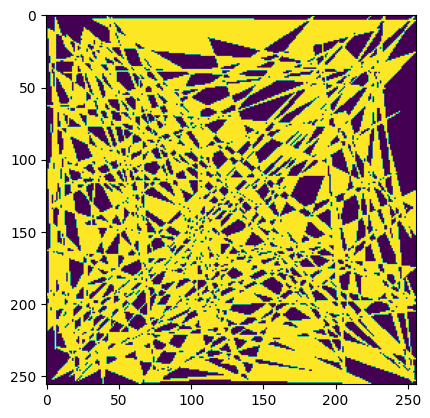

In [35]:
plt.imshow(pred_mask)

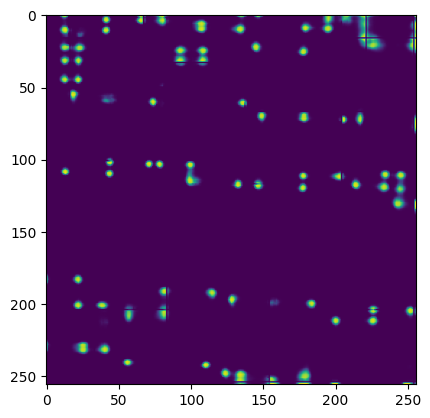

In [36]:
plt.imshow(F.sigmoid(vertex_logits[0].squeeze()).detach().cpu().numpy())

In [37]:
# Polygon to Mask
m = soft_winding_number(poly, lam=1000, img_size=WINDOW_SIZE)

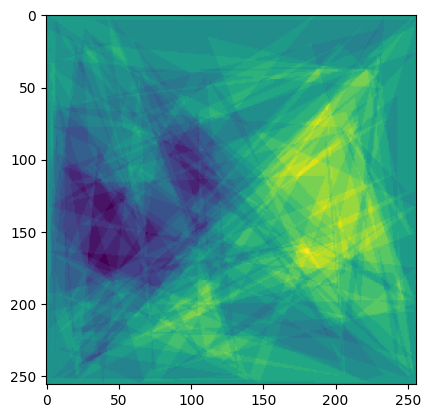

In [38]:
plt.imshow(gt_seg_mask[0].detach().cpu().numpy().squeeze() + m[0].detach().cpu().numpy())

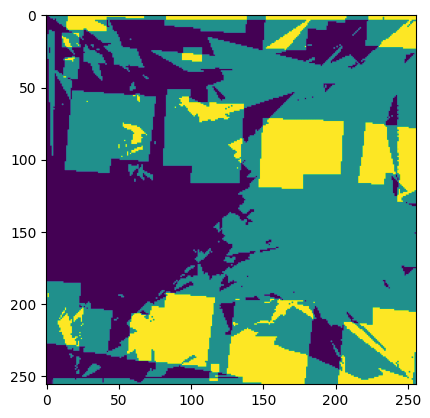

In [39]:
plt.imshow((gt_seg_mask[0].detach().cpu().numpy().squeeze() + F.sigmoid(m)[0].detach().cpu().numpy()))

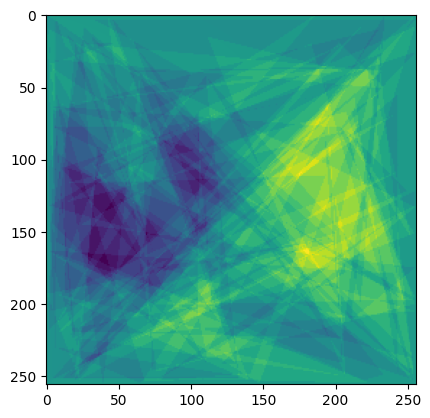

In [40]:
plt.imshow(m[0].detach().cpu().numpy())

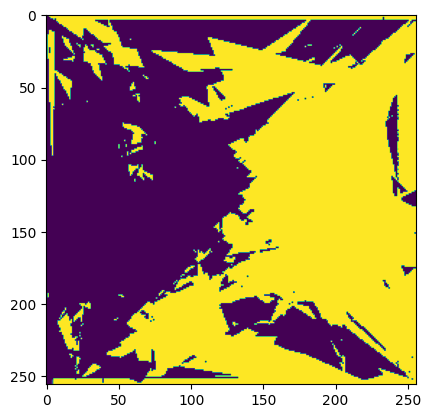

In [41]:
plt.imshow(F.sigmoid(m[0]).detach().cpu().numpy())

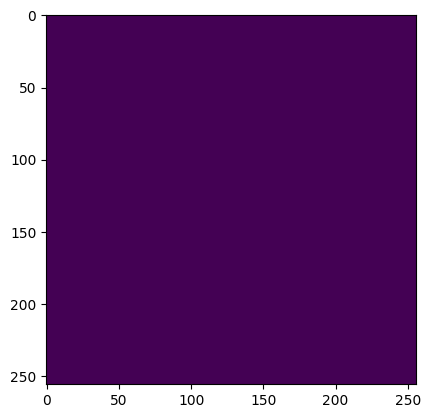

In [42]:
plt.imshow(F.softmax(m, dim=0)[0].detach().cpu().numpy())

In [43]:
m.min(), m.max()

(tensor(-3837.4038, device='cuda:0'), tensor(3311.8823, device='cuda:0'))

In [44]:
torch.sigmoid(m).min(), torch.sigmoid(m).max()

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

In [45]:
m[0, 50, 300]

IndexError: index 300 is out of bounds for dimension 2 with size 256

In [46]:
torch.sigmoid(m).unique(return_counts=True)

(tensor([0.0000e+00, 7.2903e-39, 4.2681e-38, 7.9505e-36, 5.5060e-35, 9.7260e-35,
         8.1197e-34, 1.0214e-33, 2.3383e-33, 4.6553e-32, 6.6177e-32, 1.4362e-31,
         2.0579e-31, 7.4453e-31, 2.5706e-30, 7.9849e-30, 1.1569e-29, 2.0543e-29,
         2.2179e-29, 3.7973e-29, 4.4756e-29, 5.6900e-29, 7.0043e-29, 1.3006e-28,
         1.5121e-28, 1.5511e-28, 1.7922e-28, 2.1509e-28, 2.3381e-28, 2.7648e-28,
         2.8151e-28, 6.9484e-28, 1.2596e-27, 2.9489e-27, 3.8592e-27, 1.1713e-26,
         1.4324e-26, 9.0127e-26, 1.2466e-25, 2.7956e-25, 3.3448e-25, 3.6476e-25,
         1.1686e-24, 8.5996e-24, 2.1524e-23, 2.3004e-23, 1.1881e-22, 1.8856e-21,
         3.9107e-21, 1.4481e-20, 1.7927e-20, 2.2846e-20, 3.9330e-20, 1.1712e-19,
         1.0185e-18, 2.5033e-17, 9.5846e-17, 1.4925e-15, 2.7001e-15, 3.7902e-15,
         2.3105e-14, 2.4719e-14, 3.3538e-13, 5.6499e-13, 9.3597e-13, 1.3184e-12,
         1.4793e-12, 2.1127e-12, 4.6682e-12, 8.6739e-12, 1.9434e-11, 1.9936e-11,
         4.4864e-11, 6.9410e

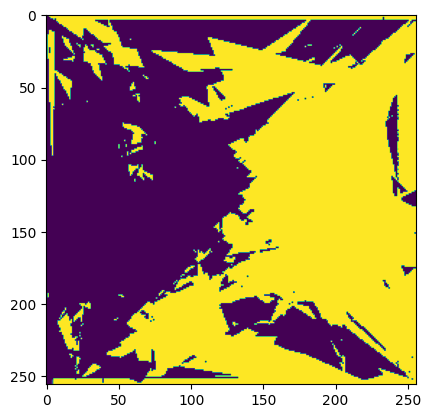

In [47]:
plt.imshow(torch.sigmoid(m[0]).detach().cpu().numpy())

In [48]:
torch.topk(vertex_logits[0,0].flatten(), 256)

torch.return_types.topk(
values=tensor([5.8614, 3.9664, 3.7446, 3.7155, 3.6763, 3.6479, 3.6448, 3.6387, 3.5841,
        3.5553, 3.5544, 3.5494, 3.5299, 3.4669, 3.4452, 3.4417, 3.4360, 3.4345,
        3.4158, 3.4088, 3.3951, 3.3401, 3.3338, 3.3134, 3.3077, 3.3005, 3.2763,
        3.2561, 3.2558, 3.2487, 3.2376, 3.2353, 3.2097, 3.2091, 3.1976, 3.1868,
        3.1642, 3.1258, 3.1195, 3.0949, 3.0926, 3.0908, 3.0630, 3.0610, 3.0554,
        3.0313, 3.0306, 3.0195, 3.0194, 3.0160, 3.0154, 3.0151, 3.0139, 3.0043,
        3.0037, 2.9955, 2.9955, 2.9879, 2.9865, 2.9794, 2.9782, 2.9782, 2.9751,
        2.9704, 2.9647, 2.9635, 2.9624, 2.9486, 2.9392, 2.9226, 2.9158, 2.9088,
        2.9071, 2.9039, 2.9029, 2.8911, 2.8908, 2.8863, 2.8858, 2.8836, 2.8835,
        2.8735, 2.8734, 2.8685, 2.8658, 2.8551, 2.8541, 2.8466, 2.8462, 2.8409,
        2.8399, 2.8396, 2.8361, 2.8333, 2.8308, 2.8285, 2.8267, 2.8248, 2.8161,
        2.8092, 2.8080, 2.8059, 2.8049, 2.8039, 2.8026, 2.7973, 2.7870, 2.7823,
        

In [50]:
print('RGB: ', image.shape)
print('Features Map: ', features.shape)
print('Vertex Logits: ', vertex_logits.shape)
print('Graph: ', graph.shape)
print('Permutation Matrix: ', permutation_matrix.shape)
print('Sinkhorn Scores: ', sinkhorn_scores.shape)
print('Scores: ', scores.shape)
# print('Graph Refined: ', graph_refined.shape)

RGB:  torch.Size([1, 3, 256, 256])
Features Map:  torch.Size([1, 64, 256, 256])
Vertex Logits:  torch.Size([1, 1, 256, 256])
Graph:  torch.Size([1, 256, 2])
Permutation Matrix:  torch.Size([1, 256, 256])
Sinkhorn Scores:  torch.Size([1, 256, 256])
Scores:  torch.Size([1, 256, 256])


In [51]:
graph[0].sort(dim=0, descending=True)

torch.return_types.sort(
values=tensor([[255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 254.],
        [255., 254.],
        [255., 254.],
        [255., 254.],
        [255., 253.],
        [255., 253.],
        [255., 253.],
        [255., 253.],
        [255., 253.],
        [255., 253.],
        [255., 252.],
        [254., 252.],
        [254., 252.],
        [253., 252.],
        [253., 252.],
        [253., 252.],
        [253., 252.],
        [252., 251.],
        [252., 251.],
        [250., 251.],
        [249., 251.],
        [249., 251.],
        [248., 251.],
        [246., 250.],
        [244., 250.],
        [243., 250.],
        [243., 249.],
        [242., 248.],
        [241., 248.],
        [240., 248.],
        [237., 247.],
        [234., 247.],
        [234., 247.],
        [234., 247.],
        [233., 246.],
        [233., 246.],
        [232., 243.],
        [230., 242.],
        [230., 242.],


In [52]:
gt_graph[0].sort(dim=0, descending=True)

torch.return_types.sort(
values=tensor([[255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 255.],
        [255., 254.],
        [253., 253.],
        [245., 253.],
        [245., 253.],
        [243., 250.],
        [234., 249.],
        [233., 249.],
        [226., 243.],
        [226., 242.],
        [223., 242.],
        [222., 238.],
        [222., 238.],
        [221., 234.],
        [221., 233.],
        [221., 230.],
        [219., 229.],
        [217., 227.],
        [216., 226.],
        [207., 221.],
        [206., 215.],
        [206., 213.],
        [205., 208.],
        [203., 207.],
        [202., 206.],
        [202., 205.],
        [194., 203.],
        [193., 203.],
        [185., 203.],
        [180., 202.],
        [179., 199.],
        [178., 199.],
        [177., 197.],
        [177., 197.],
        [161., 196.],
        [155., 193.],
        [155., 186.],
        [152., 185.],
        [150., 185.],
        [150., 130.],


In [53]:
graph.shape

torch.Size([1, 256, 2])

#### Check this flow for GT
permutations -> polygons -> seg mask

In [54]:
m = np.zeros((320, 320), dtype=np.uint8)
cv2.fillPoly(m, [poly[0][3].detach().cpu().numpy()], 1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

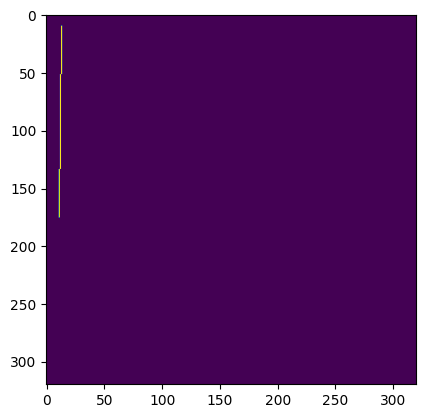

In [55]:
plt.imshow(m)

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/drawing.cpp:2431: error: (-215:Assertion failed) p.checkVector(2, CV_32S) >= 0 in function 'fillPoly'


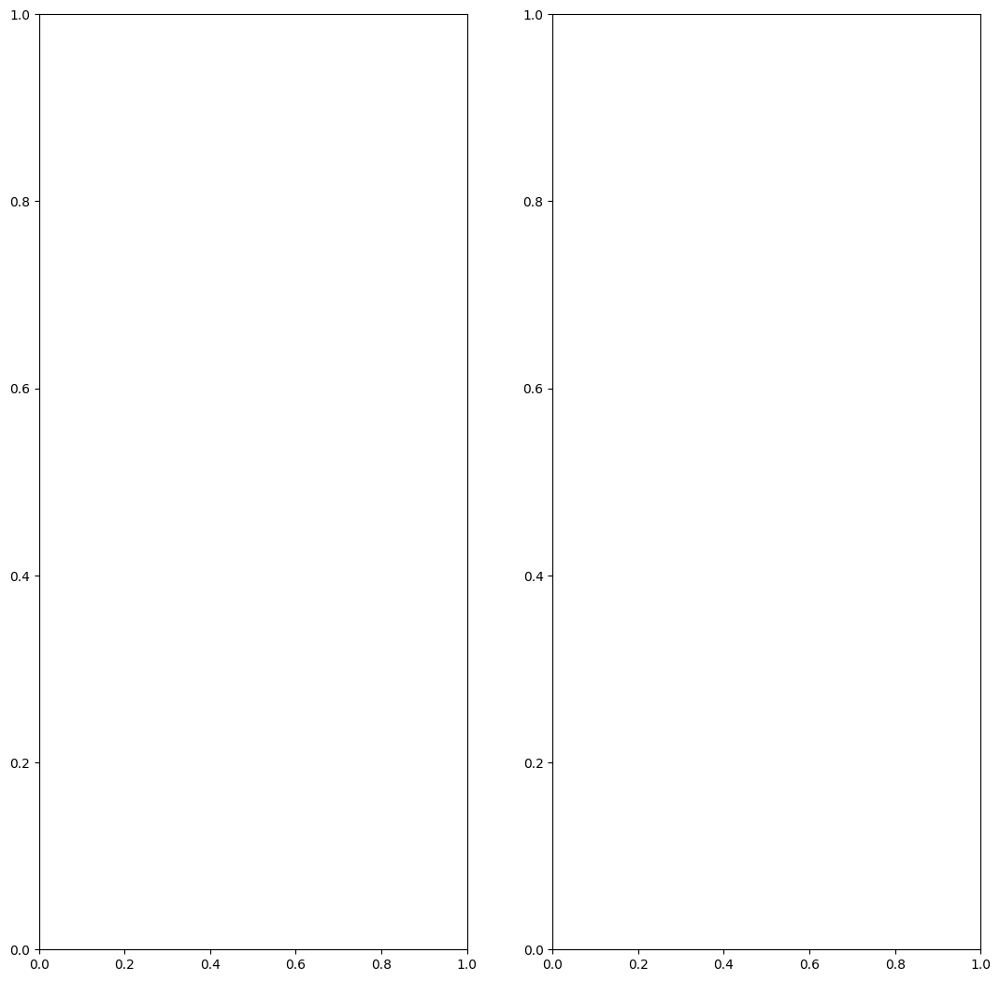

In [56]:
fig ,axes = plt.subplots(1, 2, figsize=(13, 13))

axes[0].imshow(polygon_to_seg_mask(poly[0], 320).permute(1,0))
axes[0].set_title('Predicted Segmentation Mask')

axes[1].imshow(polygon_to_seg_mask(gt_polygons[0], 320))
axes[1].set_title('Ground Truth Segmentation Mask')

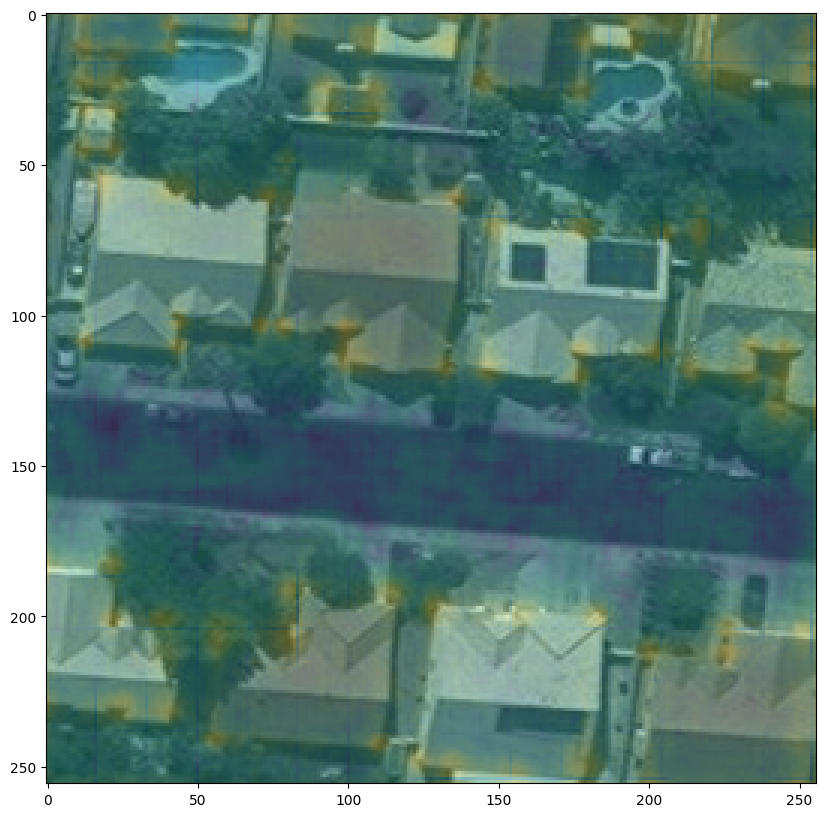

In [57]:
plt.figure(figsize=(10,10))
plt.imshow(image[0].permute(1,2,0).cpu().numpy())
plt.imshow(vertex_logits[0].cpu().detach().numpy().squeeze(), alpha=.3)

#### The values of Sinkhorn Scores
Correct indiced (vertices) have lower values in sinkhorn

In [58]:
sinkhorn_scores[0, 250, 250]

tensor(-10.7527, device='cuda:0', grad_fn=<SelectBackward0>)

In [59]:
sinkhorn_scores.min(), sinkhorn_scores.max()

(tensor(-13.5045, device='cuda:0', grad_fn=<MinBackward1>),
 tensor(-7.8387, device='cuda:0', grad_fn=<MaxBackward1>))

In [60]:
sinkhorn_scores[0, 250, 250] # True Positive

tensor(-10.7527, device='cuda:0', grad_fn=<SelectBackward0>)

In [61]:
sinkhorn_scores[0, 200, 230] # False

tensor(-11.4614, device='cuda:0', grad_fn=<SelectBackward0>)

In [62]:
# softmax
F.softmax(sinkhorn_scores, dim=2)

tensor([[[0.0036, 0.0047, 0.0040,  ..., 0.0033, 0.0030, 0.0031],
         [0.0041, 0.0051, 0.0027,  ..., 0.0028, 0.0039, 0.0045],
         [0.0037, 0.0038, 0.0050,  ..., 0.0029, 0.0026, 0.0026],
         ...,
         [0.0032, 0.0026, 0.0036,  ..., 0.0183, 0.0032, 0.0046],
         [0.0039, 0.0036, 0.0039,  ..., 0.0042, 0.0051, 0.0017],
         [0.0031, 0.0059, 0.0021,  ..., 0.0038, 0.0096, 0.0152]]],
       device='cuda:0', grad_fn=<SoftmaxBackward0>)

In [63]:
torch.sigmoid(sinkhorn_scores[0, 250, 250]) # Bright

tensor(2.1387e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)

In [64]:
torch.sigmoid(sinkhorn_scores[0, 200, 230]) # Dark

tensor(1.0529e-05, device='cuda:0', grad_fn=<SigmoidBackward0>)

So the brighter the value, closer it is to the gt

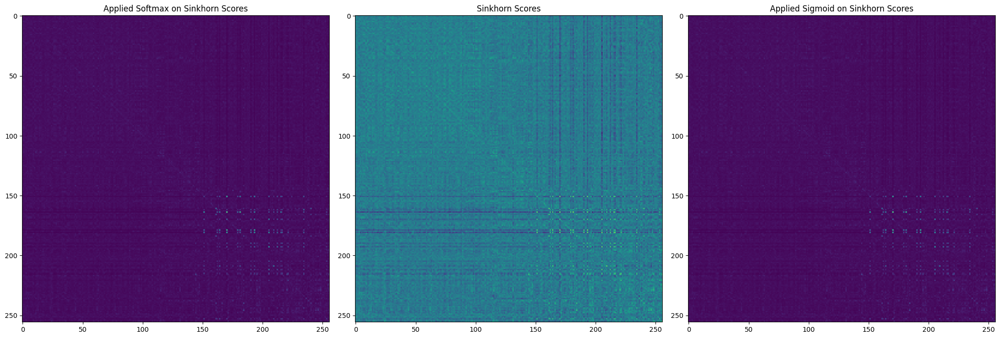

In [65]:
fig, axes = plt.subplots(1, 3, figsize=(21, 21))

axes[0].imshow(F.softmax(sinkhorn_scores[0], dim=1).cpu().detach().numpy())
axes[0].set_title('Applied Softmax on Sinkhorn Scores')


axes[1].imshow(sinkhorn_scores[0].cpu().detach().numpy())
axes[1].set_title('Sinkhorn Scores')


axes[2].imshow(torch.sigmoid(sinkhorn_scores[0]).cpu().detach().numpy())
axes[2].set_title('Applied Sigmoid on Sinkhorn Scores')


plt.tight_layout()
plt.show()

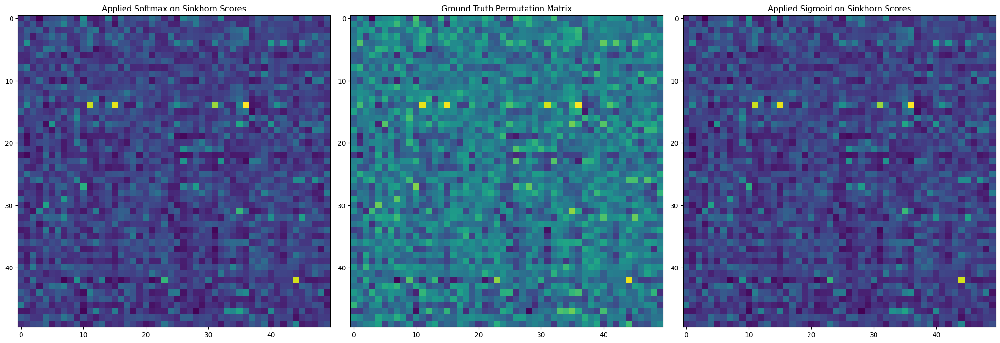

In [66]:
fig, axes = plt.subplots(1, 3, figsize=(21, 21))

axes[0].imshow(F.softmax(sinkhorn_scores[0], dim=0).cpu().detach().numpy()[100:150, :50])
axes[0].set_title('Applied Softmax on Sinkhorn Scores')

axes[1].imshow(sinkhorn_scores[0].cpu().detach().numpy()[100:150, :50])
axes[1].set_title('Ground Truth Permutation Matrix')

axes[2].imshow(torch.sigmoid(sinkhorn_scores[0]).cpu().detach().numpy()[100:150, :50])
axes[2].set_title('Applied Sigmoid on Sinkhorn Scores')

plt.tight_layout()
plt.show()

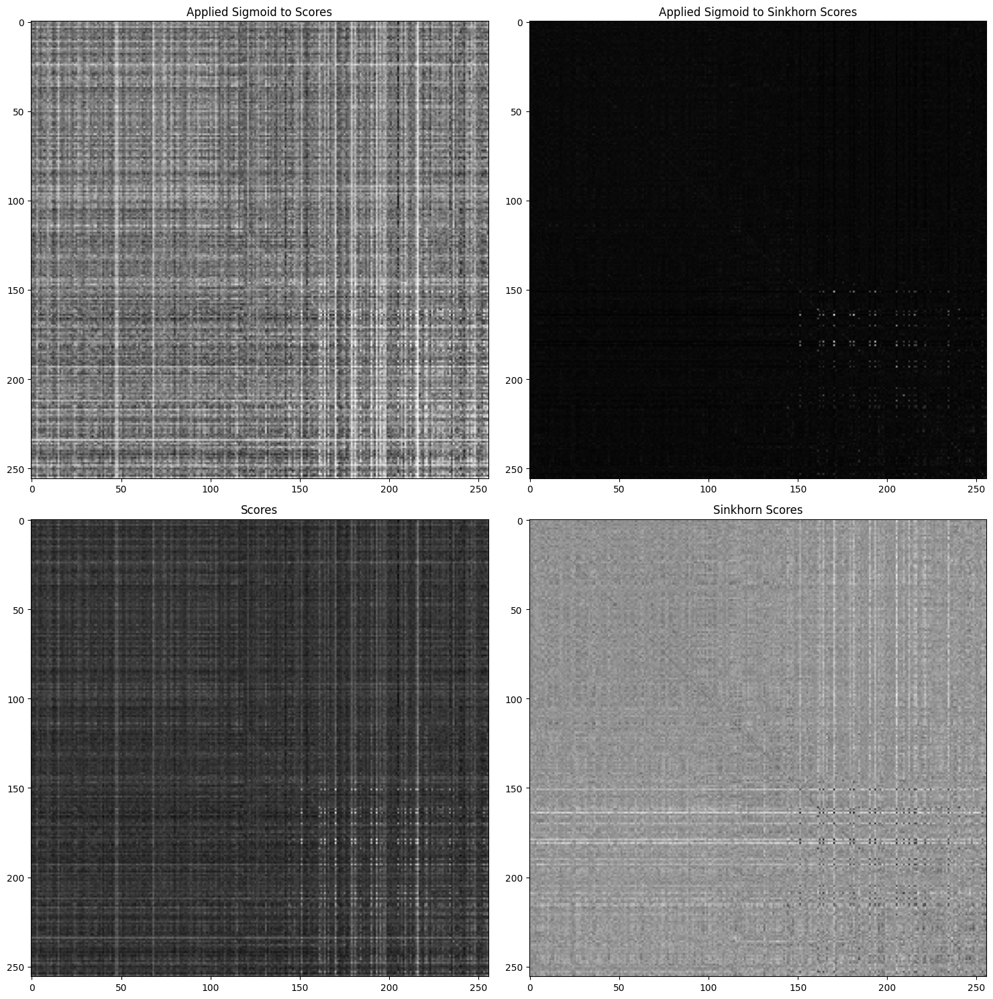

In [67]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

axes[0][0].imshow(torch.sigmoid(scores[0]).cpu().detach().numpy(), cmap='gray')
axes[0][0].set_title("Applied Sigmoid to Scores")

axes[0][1].imshow(torch.sigmoid(sinkhorn_scores[0]).cpu().detach().numpy(), cmap='gray')
axes[0][1].set_title("Applied Sigmoid to Sinkhorn Scores")

axes[1][0].imshow(scores[0].cpu().detach().numpy(), cmap='gray')
axes[1][0].set_title("Scores")

axes[1][1].imshow(-sinkhorn_scores[0].cpu().detach().numpy(), cmap='gray')
axes[1][1].set_title("Sinkhorn Scores")

plt.tight_layout()
plt.show()

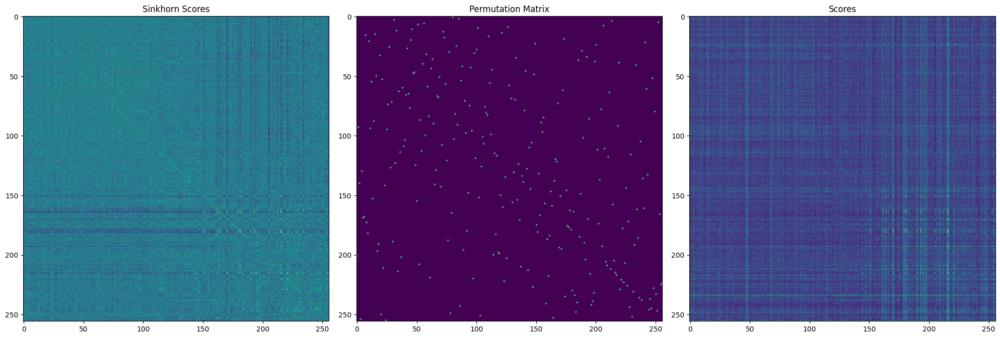

In [68]:
i = 0


fig, axes = plt.subplots(1, 3, figsize=(20, 10))

axes[0].imshow(sinkhorn_scores[i].detach().cpu().numpy())
axes[0].set_title("Sinkhorn Scores")

axes[1].imshow(permutation_matrix[i].detach().cpu().numpy())
axes[1].set_title("Permutation Matrix")

axes[2].imshow(scores[i].detach().cpu().numpy())
axes[2].set_title("Scores")

plt.tight_layout()
plt.show()

In [69]:
mask1 = graph_to_vertex_mask(graph, image)

mask2 = polygon_to_vertex_mask(tensor_to_numpy(poly)).permute(0, 2, 1)

IndexError: tensors used as indices must be long, int, byte or bool tensors

In [70]:
mask1.shape, mask2.shape

NameError: name 'mask1' is not defined

NameError: name 'mask1' is not defined

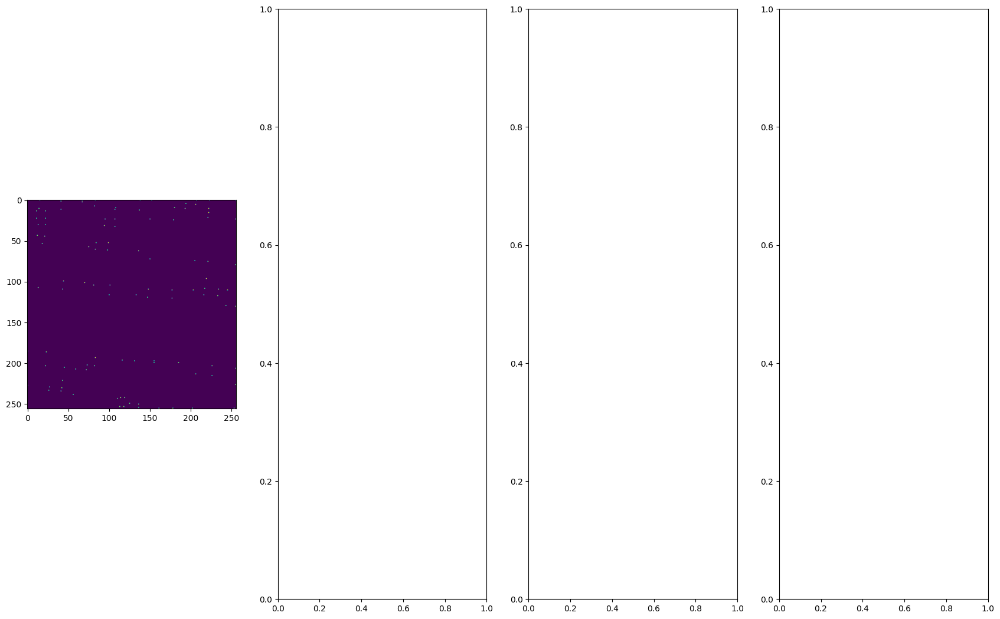

In [71]:
# plot mask and seg mask
i = 0
fig, axes = plt.subplots(1, 4, figsize=(21, 13))
axes[0].imshow(gt_vertex_mask[i].cpu().numpy().squeeze())
axes[1].imshow(mask1[i])
axes[2].imshow(mask2[i])
axes[3].imshow(gt_seg_mask[i].cpu().numpy().squeeze())


axes[0].set_title('GT Vertex Mask')
axes[1].set_title('Prediction after NMS')
axes[2].set_title('Prediction from Permutations Matrix + Graph')
axes[3].set_title('GT Segmentation Mask')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Prediction Permutation Matrix')

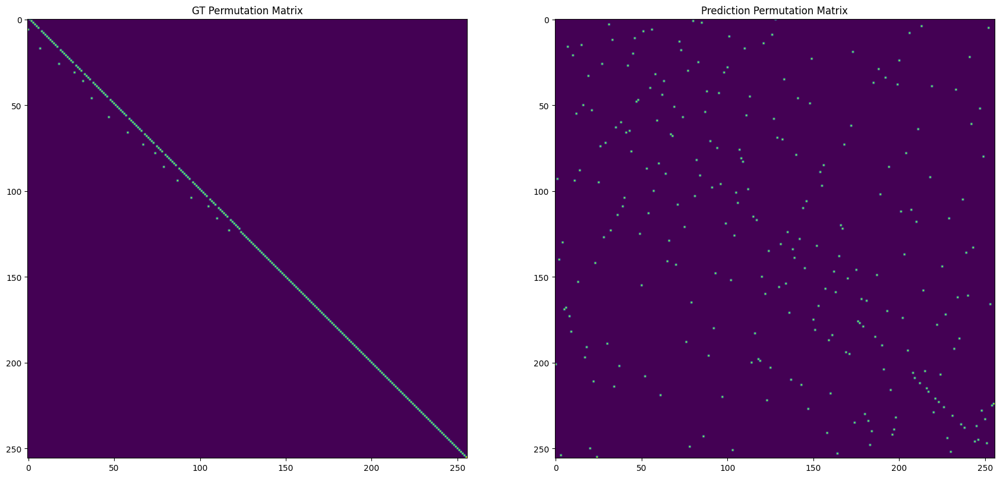

In [72]:
i = 0

fig, axes = plt.subplots(1, 2, figsize=(21, 13))

axes[0].imshow(gt_permutation_matrix[i].cpu().numpy())
axes[1].imshow(permutation_matrix[i].cpu().numpy())

axes[0].set_title('GT Permutation Matrix')
axes[1].set_title('Prediction Permutation Matrix')

Text(0.5, 1.0, 'Prediction Permutation Matrix')

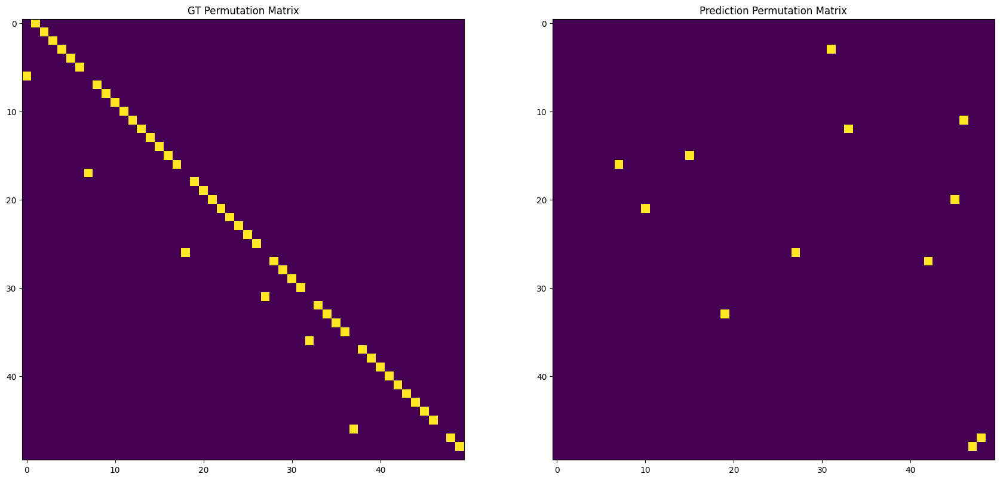

In [73]:
i = 0

fig, axes = plt.subplots(1, 2, figsize=(21, 13))

axes[0].imshow(gt_permutation_matrix[i].cpu().numpy()[:50,:50])
axes[1].imshow(permutation_matrix[i].cpu().numpy()[:50,:50])

axes[0].set_title('GT Permutation Matrix')
axes[1].set_title('Prediction Permutation Matrix')

In [74]:
torch.set_printoptions(threshold=100_000)

gt_permutation_matrix == permutation_matrix

tensor([[[ True, False,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  T

In [75]:
(gt_permutation_matrix[i] == permutation_matrix[i])

tensor([[ True, False,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  

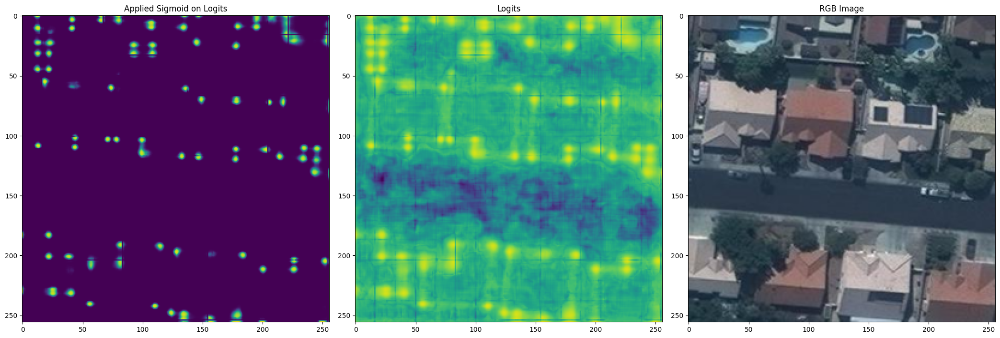

In [76]:
i = 0

fig, axes = plt.subplots(1, 3, figsize=(21, 13))
axes[0].imshow(torch.sigmoid(vertex_logits)[i].detach().cpu().numpy().squeeze())
axes[1].imshow(vertex_logits[i].detach().cpu().numpy().squeeze())
axes[2].imshow(image[i].cpu().numpy().squeeze().transpose(1, 2, 0))

axes[0].set_title('Applied Sigmoid on Logits')
axes[1].set_title('Logits')
axes[2].set_title('RGB Image')

plt.tight_layout()
plt.show()